<a href="https://colab.research.google.com/github/ruslanraupoff/machine-vision-057601/blob/master/video_transformers.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Video Classification with Transformers

**Author:** [Sayak Paul](https://twitter.com/RisingSayak)<br>
**Date created:** 2021/06/08<br>
**Last modified:** 2021/06/08<br>
**Description:** Training a video classifier with hybrid transformers.

This example is a follow-up to the
[Video Classification with a CNN-RNN Architecture](https://keras.io/examples/vision/video_classification/)
example. This time, we will be using a Transformer-based model
([Vaswani et al.](https://arxiv.org/abs/1706.03762)) to classify videos. You can follow
[this book chapter](https://livebook.manning.com/book/deep-learning-with-python-second-edition/chapter-11)
in case you need an introduction to Transformers (with code). After reading this
example, you will know how to develop hybrid Transformer-based models for video
classification that operate on CNN feature maps.

This example requires TensorFlow 2.5 or higher, as well as TensorFlow Docs, which can be
installed using the following command:

In [ ]:
!pip install -q git+https://github.com/tensorflow/docs

## Data collection

As done in the [predecessor](https://keras.io/examples/vision/video_classification/) to
this example, we will be using a subsampled version of the
[USCD Anomaly Detection Dataset](http://www.svcl.ucsd.edu/projects/anomaly/dataset.htm), [Avenue Dataset for Abnormal Event Detection](http://www.cse.cuhk.edu.hk/leojia/projects/detectabnormal/dataset.html)
a well-known benchmark dataset. In case you want to operate on a larger subsample or
even the entire dataset, please refer to
[this notebook](https://colab.research.google.com/github/sayakpaul/Action-Recognition-in-TensorFlow/blob/main/Data_Preparation_UCF101.ipynb).

## Setup

In [ ]:
import os
import cv2
import random
import imageio
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers
from tensorflow_docs.vis import embed
from sklearn.model_selection import train_test_split

In [ ]:
dir_root = './'
label_csv_path = dir_root+'data.csv'

In [ ]:
df_csv = pd.read_csv(label_csv_path, header = None)
df_csv.columns = ['video_name', 'start', 'end', 'tag', 'train_val_test']
df_csv['video_name'] = df_csv['video_name'].apply(lambda x: x[2:])
df_csv

,video_name,start,end,tag,train_val_test
0,data/001.mp4,0.0,20.00,normal,train
1,data/002.mp4,0.0,7.00,biker,train
2,data/003.mp4,0.0,20.00,normal,train
3,data/004.mp4,0.0,20.00,normal,train
4,data/005.mp4,0.0,20.00,normal,train
...,...,...,...,...,...
147,data/131.mp4,0.0,5.80,normal,test
148,data/132.mp4,0.0,14.64,normal,test
149,data/133.mp4,13.0,16.00,strange action,test
150,data/134.mp4,0.0,14.12,normal,test


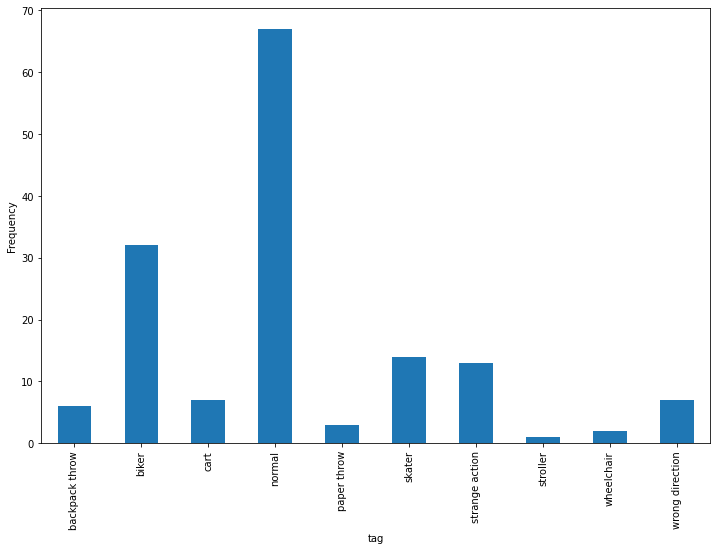

In [ ]:
df_csv.groupby('tag')['tag'].count().plot(kind='bar', figsize = (12, 8), ylabel='Frequency')
plt.show()

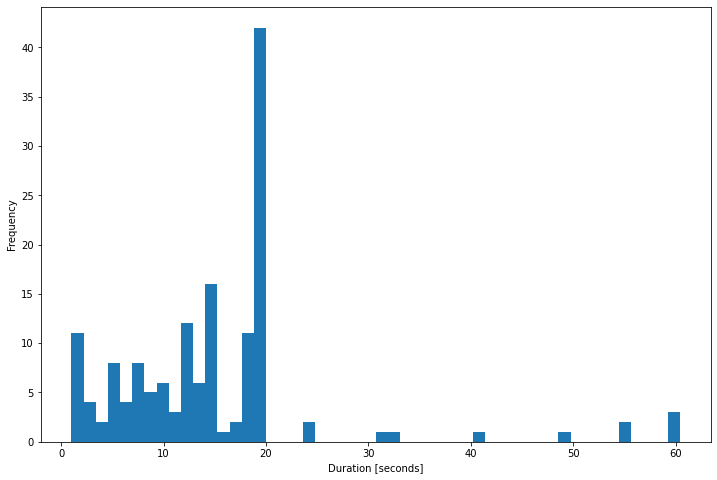

In [ ]:
(df_csv['end'] - df_csv['start']).plot(kind='hist', figsize = (12, 8), bins = 50)
plt.xlabel('Duration [seconds]')
plt.show()

## Define hyperparameters

In [ ]:
MAX_SEQ_LENGTH = 300
NUM_FEATURES = 1024
IMG_SIZE = 360#640

BATCH_SIZE = 32
EPOCHS = 20

## Data preparation

We will mostly be following the same data preparation steps in this example, except for
the following changes:

* We reduce the image size to 128x128 instead of 224x224 to speed up computation.
* Instead of using a pre-trained [InceptionV3](https://arxiv.org/abs/1512.00567) network,
we use a pre-trained
[DenseNet121](http://openaccess.thecvf.com/content_cvpr_2017/papers/Huang_Densely_Connected_Convolutional_CVPR_2017_paper.pdf)
for feature extraction.
* We directly pad shorter videos to length `MAX_SEQ_LENGTH`.

First, let's load up the
[DataFrames](https://pandas.pydata.org/pandas-docs/stable/reference/api/pandas.DataFrame.html).

In [ ]:
# all
train_df, test_df = train_test_split(df_csv, train_size=0.7)
train_df.groupby('tag')['tag'].count()

# per2
#train_df, test_df = train_test_split(df_csv[71:100], train_size=0.7)
#train_df.groupby('tag')['tag'].count()

# avenue
#train_df, test_df = train_test_split(df_csv[100:], train_size=0.6)
#train_df.groupby('tag')['tag'].count()


tag
backpack throw      4
normal             12
paper throw         2
strange action      9
wrong direction     4
Name: tag, dtype: int64

In [ ]:
test_df.groupby('tag')['tag'].count()

tag
backpack throw      2
normal             11
paper throw         1
strange action      4
wrong direction     3
Name: tag, dtype: int64

In [ ]:
center_crop_layer = layers.CenterCrop(IMG_SIZE, IMG_SIZE)

def crop_center(frame):
  cropped = center_crop_layer(frame[None, ...])
  cropped = cropped.numpy().squeeze()
  return cropped

In [ ]:
# Following method is modified from this tutorial:
# https://www.tensorflow.org/hub/tutorials/action_recognition_with_tf_hub
def load_video(path, start=0, end=-1, max_frames=0):
  cap = cv2.VideoCapture(path)
  fps = cap.get(cv2.CAP_PROP_FPS)
  frames = []
  try:
    while True:
      ret, frame = cap.read()
      if not ret:
        break
      #img = frame.resize((IMG_SIZE, IMG_SIZE))
      #img = np.array(img, dtype=np.float32)
      #frame = img / 256.0
      
      frame = crop_center(frame)
      frame = frame[:, :, [2, 1, 0]]
      frames.append(frame)
      
      if len(frames) == max_frames:
        break
  finally:
    cap.release()

  st_frame = int(start*fps)

  if end!=-1:
    end_frame = int(end*fps)
      
  else:
    end_frame = -1
  
  return np.array(frames[st_frame:end_frame])

In [ ]:
def build_feature_extractor():
  feature_extractor = keras.applications.DenseNet121(
    weights="imagenet",
    include_top=False,
    pooling="avg",
    input_shape=(IMG_SIZE, IMG_SIZE, 3),
  )
  
  preprocess_input = keras.applications.densenet.preprocess_input

  inputs = keras.Input((IMG_SIZE, IMG_SIZE, 3))
  preprocessed = preprocess_input(inputs)

  outputs = feature_extractor(preprocessed)
  return keras.Model(inputs, outputs, name="feature_extractor")

feature_extractor = build_feature_extractor()

29097984/29084464 [==============================] - 1s 0us/step


In [ ]:
# Label preprocessing with StringLookup.
label_processor = keras.layers.StringLookup(num_oov_indices=0, vocabulary=np.unique(train_df["tag"]), mask_token=None)
print(label_processor.get_vocabulary())

['backpack throw', 'normal', 'paper throw', 'strange action', 'wrong direction']


In [ ]:
def prepare_all_videos(df, root_dir):
  num_samples = len(df)
  video_paths = df["video_name"].values.tolist()
  starts = df["start"].values
  ends  = df["end"].values
  labels = df["tag"].values
  labels = label_processor(labels[..., None]).numpy()

  # `frame_features` are what we will feed to our sequence model.
  frame_features = np.zeros(
    shape=(num_samples, MAX_SEQ_LENGTH, NUM_FEATURES), dtype="float32"
  )

  # For each video.
  for idx, path in enumerate(video_paths):
    # Gather all its frames and add a batch dimension.
    #print(os.path.join(root_dir, path))
    frames = load_video(os.path.join(root_dir, path), start=starts[idx], end=ends[idx])

    # Pad shorter videos.
    if len(frames) < MAX_SEQ_LENGTH:

      diff = MAX_SEQ_LENGTH - len(frames)
      padding = np.zeros((diff, IMG_SIZE, IMG_SIZE, 3), dtype='float32')

      frames = np.concatenate((frames, padding))

    frames = frames[None, ...]

    # Initialize placeholder to store the features of the current video.
    temp_frame_features = np.zeros(
      shape=(1, MAX_SEQ_LENGTH, NUM_FEATURES), dtype="float32"
    )

    # Extract features from the frames of the current video.
    for i, batch in enumerate(frames):
      video_length = batch.shape[0]
      length = min(MAX_SEQ_LENGTH, video_length)
      for j in range(length):
        if np.mean(batch[j, :]) > 0.0:
          temp_frame_features[i, j, :] = feature_extractor.predict(
            batch[None, j, :]
          )
        else:
          temp_frame_features[i, j, :] = 0.0

    frame_features[idx,] = temp_frame_features.squeeze()

  return frame_features, labels

Calling `prepare_all_videos()` on `train_df` and `test_df` takes ~20 minutes to
complete. For this reason, to save time, here we download already preprocessed NumPy arrays:

In [ ]:
train_data, train_labels = prepare_all_videos(train_df, dir_root)

In [ ]:
test_data, test_labels = prepare_all_videos(test_df, dir_root)

In [ ]:
print(f"Frame features in train set: {train_data.shape}")
print(f"Frame features in test set: {test_data.shape}")

Frame features in train set: (31, 300, 1024)
Frame features in test set: (21, 300, 1024)


## Building the Transformer-based model

We will be building on top of the code shared in
[this book chapter](https://livebook.manning.com/book/deep-learning-with-python-second-edition/chapter-11) of
[Deep Learning with Python (Second ed.)](https://www.manning.com/books/deep-learning-with-python)
by François Chollet.

First, self-attention layers that form the basic blocks of a Transformer are
order-agnostic. Since videos are ordered sequences of frames, we need our
Transformer model to take into account order information.
We do this via **positional encoding**.
We simply embed the positions of the frames present inside videos with an
[`Embedding` layer](https://keras.io/api/layers/core_layers/embedding). We then
add these positional embeddings to the precomputed CNN feature maps.

In [ ]:
class PositionalEmbedding(layers.Layer):
  def __init__(self, sequence_length, output_dim, **kwargs):
    super().__init__(**kwargs)
    self.position_embeddings = layers.Embedding(
      input_dim=sequence_length, output_dim=output_dim
    )
    self.sequence_length = sequence_length
    self.output_dim = output_dim

  def call(self, inputs):
    # The inputs are of shape: `(batch_size, frames, num_features)`
    length = tf.shape(inputs)[1]
    positions = tf.range(start=0, limit=length, delta=1)
    embedded_positions = self.position_embeddings(positions)
    return inputs + embedded_positions

  def compute_mask(self, inputs, mask=None):
    mask = tf.reduce_any(tf.cast(inputs, "bool"), axis=-1)
    return mask


Now, we can create a subclassed layer for the Transformer.

In [ ]:
class TransformerEncoder(layers.Layer):
  def __init__(self, embed_dim, dense_dim, num_heads, **kwargs):
    super().__init__(**kwargs)
    self.embed_dim = embed_dim
    self.dense_dim = dense_dim
    self.num_heads = num_heads
    self.attention = layers.MultiHeadAttention(
      num_heads=num_heads, key_dim=embed_dim, dropout=0.3
    )
    self.dense_proj = keras.Sequential(
      [layers.Dense(dense_dim, activation=tf.nn.gelu), layers.Dense(embed_dim),]
    )
    self.layernorm_1 = layers.LayerNormalization()
    self.layernorm_2 = layers.LayerNormalization()

  def call(self, inputs, mask=None):
    if mask is not None:
      mask = mask[:, tf.newaxis, :]

    attention_output = self.attention(inputs, inputs, attention_mask=mask)
    proj_input = self.layernorm_1(inputs + attention_output)
    proj_output = self.dense_proj(proj_input)
    return self.layernorm_2(proj_input + proj_output)


In [ ]:
def prepare_single_video(frames):
  frame_features = np.zeros(shape=(1, MAX_SEQ_LENGTH, NUM_FEATURES), dtype="float32")

  # Pad shorter videos.
  if len(frames) < MAX_SEQ_LENGTH:
    diff = MAX_SEQ_LENGTH - len(frames)
    padding = np.zeros((diff, IMG_SIZE, IMG_SIZE, 3))
    #print(frames[0], padding[0])
    frames = np.concatenate((frames, padding))

  frames = frames[None, ...]

  # Extract features from the frames of the current video.
  for i, batch in enumerate(frames):
    video_length = batch.shape[0]
    length = min(MAX_SEQ_LENGTH, video_length)
    for j in range(length):
      if np.mean(batch[j, :]) > 0.0:
        frame_features[i, j, :] = feature_extractor.predict(batch[None, j, :])
      else:
        frame_features[i, j, :] = 0.0

  return frame_features


def predict_action(path, start, end):
  class_vocab = label_processor.get_vocabulary()

  frames = load_video(os.path.join(dir_root, path), start, end)
  print(len(frames))
  frame_features = prepare_single_video(frames)
  probabilities = trained_model.predict(frame_features)[0]

  for i in np.argsort(probabilities)[::-1]:
    print(f"  {class_vocab[i]}: {probabilities[i] * 100:5.2f}%")
  return frames


# This utility is for visualization.
# Referenced from:
# https://www.tensorflow.org/hub/tutorials/action_recognition_with_tf_hub
def to_gif(images, name='animation'):
  converted_images = images.astype(np.uint8)
  imageio.mimsave(name+".gif", converted_images, fps=10)
  return embed.embed_file(name+".gif")

## Utility functions for training

In [ ]:
def get_compiled_model():
  sequence_length = MAX_SEQ_LENGTH
  embed_dim = NUM_FEATURES
  dense_dim = 4
  num_heads = 1
  classes = len(label_processor.get_vocabulary())

  inputs = keras.Input(shape=(None, None))
  x = PositionalEmbedding(
    sequence_length, embed_dim, name="frame_position_embedding"
  )(inputs)
  x = TransformerEncoder(embed_dim, dense_dim, num_heads, name="transformer_layer")(x)
  x = layers.GlobalMaxPooling1D()(x)
  x = layers.Dropout(0.5)(x)
  outputs = layers.Dense(classes, activation="softmax")(x)
  model = keras.Model(inputs, outputs)

  model.compile(
    optimizer="adam", loss="sparse_categorical_crossentropy", metrics=["accuracy"]
  )
  return model


checkpoint_path = dir_root+"trained/cp-{epoch:04d}.ckpt"
checkpoint_dir = os.path.dirname(checkpoint_path)

def run_experiment():

  #checkpoint = keras.callbacks.ModelCheckpoint(
  #  checkpoint_path,
  #  save_weights_only=True,
  #  save_freq=5*batch_size,
  #  verbose=1
  #)

  model = get_compiled_model()
  
  #model.save_weights(checkpoint_path.format(epoch=0))

  h = model.fit(
    train_data,
    train_labels,
    verbose=0,
    validation_split=0.15,
    epochs=EPOCHS
  )

  _, accuracy = model.evaluate(test_data, test_labels)
  print(f"Test accuracy: {round(accuracy * 100, 2)}%")

  return model


## Model training and inference

In [ ]:
trained_model = run_experiment()

1/1 [==============================] - 0s 45ms/step - loss: 1.3637 - accuracy: 0.5238
Test accuracy: 52.38%


In [ ]:
trained_model.summary()

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_3 (InputLayer)        [(None, None, None)]      0         
                                                                 
 frame_position_embedding (P  (None, None, 1024)       307200    
 ositionalEmbedding)                                             
                                                                 
 transformer_layer (Transfor  (None, None, 1024)       4211716   
 merEncoder)                                                     
                                                                 
 global_max_pooling1d (Globa  (None, 1024)             0         
 lMaxPooling1D)                                                  
                                                                 
 dropout (Dropout)           (None, 1024)              0         
                                                             

In [ ]:
#trained_model.save(dir_root+'trained/model.h5')
#trained_model.save_pretrained(dir_root+'trained/model.h5')

In [ ]:
#trained_json = trained_model.to_json()
#with open(dir_root+"pretrained_weights.json", "w") as f:
#  f.write(trained_json)


Test video path: ('data/102.mp4', 25.0, 27.0)
50
  strange action: 41.32%
  normal: 29.33%
  wrong direction: 13.90%
  backpack throw: 12.60%
  paper throw:  0.64%
  skater:  0.62%
  cart:  0.60%
  biker:  0.46%
  stroller:  0.27%
  wheelchair:  0.26%



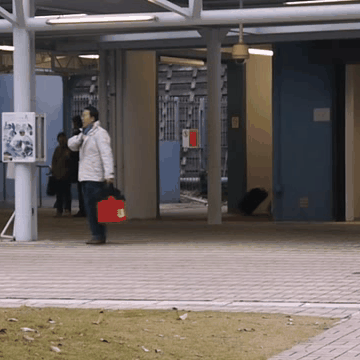

In [ ]:
video_paths = test_df["video_name"].values.tolist()
starts = test_df["start"].values
ends  = test_df["end"].values
labels = test_df["tag"].values

np.random.seed(42)
idx = np.random.randint(0, len(test_df))

test_video = video_paths[idx]
start = starts[idx]
end = ends[idx]

print(f"Test video path: {test_video, start, end}")
test_frames = predict_action(test_video, start = start, end = end)
to_gif(test_frames[:MAX_SEQ_LENGTH])

The performance of our model is far from optimal, because it was trained on a
small dataset.

Test video path: ('data/133.mp4', 13.0, 16.0)
75
  strange action: 42.10%
  normal: 28.17%
  wrong direction: 14.17%
  backpack throw: 12.93%
  paper throw:  0.63%
  skater:  0.55%
  cart:  0.54%
  biker:  0.40%
  stroller:  0.26%
  wheelchair:  0.25%



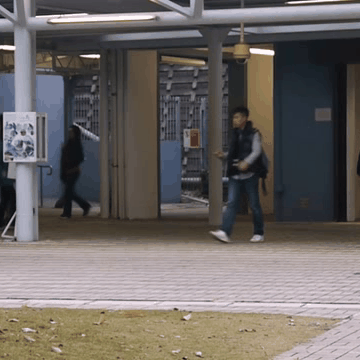

In [ ]:
random.seed(10)

idx = np.random.randint(0, len(test_df))

test_video = video_paths[idx]
start = starts[idx]
end = ends[idx]

print(f"Test video path: {test_video, start, end}")
test_frames = predict_action(test_video, start = start, end = end)
to_gif(test_frames[:MAX_SEQ_LENGTH], name=str(idx))